In [2]:
# trimming frames from the alphafold trajectories

protein_names = ["BPTI", "BRD4", "HOIP", "LXR", "MBP"]

conf_thresholds = [(1,99.95),(2.5,99),(10,99.4),(1.25,99.9),(5,99.4)]

con_thresholds = [(0.1,99.95),(1,99),(1.5,99.4),(2,99.5),(4,99.5)]
cov_thresholds = [(0.1,99.9),(1,99.8),(1.5,99.9),(1.5,99.9),(4,99.9)]

res_thresholds = [(0.1,99.95),(1,99.5),(0.25,99.4),(0.05,99.5),(0.25,99.5)]


k_clusters = 20



In [3]:

import os 

import MDAnalysis as mda
import numpy as np
import json




/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [4]:
BPTI_top_path = "/home/alexi/Documents/ValDX/raw_data/HDXer_tutorial/BPTI/BPTI_simulations/P00974_60_1_af_sample_127_10000_protonated.pdb"
BPTI_traj_path = "/home/alexi/Documents/ValDX/raw_data/HDXer_tutorial/BPTI/BPTI_simulations/P00974_60_1_af_sample_127_10000_protonated.xtc"
BPTI_json_path = "/home/alexi/Documents/ValDX/raw_data/HDXer_tutorial/BPTI/BPTI_simulations/P00974_60_1_af_sample_127_10000_ranks.json"
BPTI_segs_path = "/home/alexi/Documents/ValDX/raw_data/HDXer_tutorial/BPTI/BPTI_expt_data/BPTI_residue_segs.txt"
BPTI_num_residues = 58


BRD4_top_path = "/home/alexi/Documents/ValDX/raw_data/BRD4/BRD4_APO/BRD4_APO_484_1_af_sample_127_10000_protonated.pdb"
BRD4_traj_path = "/home/alexi/Documents/ValDX/raw_data/BRD4/BRD4_APO/BRD4_APO_484_1_af_sample_127_10000_protonated.xtc"
BRD4_json_path = "/home/alexi/Documents/ValDX/raw_data/BRD4/BRD4_APO/BRD4_APO_484_1_af_sample_127_10000_ranks.json"
BRD4_segs_path = "/home/alexi/Documents/ValDX/raw_data/BRD4/BRD4_APO/BRD4_APO_segs.txt"
BRD4_num_residues = 484

HOIP_top_path = "/home/alexi/Documents/ValDX/raw_data/HOIP/HOIP_apo/HOIP_apo697_1_af_sample_127_10000_protonated.pdb"
HOIP_traj_path = "/home/alexi/Documents/ValDX/raw_data/HOIP/HOIP_apo/HOIP_apo697_1_af_sample_127_10000_protonated.xtc"
HOIP_json_path = "/home/alexi/Documents/ValDX/raw_data/HOIP/HOIP_apo/HOIP_apo697_1_af_sample_127_10000_ranks.json"
HOIP_segs_path = "/home/alexi/Documents/ValDX/raw_data/HOIP/HOIP_apo/HOIP_APO_segs.txt"
HOIP_num_residues = 376

LXR_top_path = "/home/alexi/Documents/ValDX/raw_data/LXRalpha/LXRalpha_APO/LXRa200_1_af_sample_127_10000_protonated.pdb"
LXR_traj_path = "/home/alexi/Documents/ValDX/raw_data/LXRalpha/LXRalpha_APO/LXRa200_1_af_sample_127_10000_protonated.xtc"
LXR_json_path = "/home/alexi/Documents/ValDX/raw_data/LXRalpha/LXRalpha_APO/LXRa200_1_af_sample_127_10000_ranks.json"
LXR_segs_path = "/home/alexi/Documents/ValDX/raw_data/LXRalpha/LXRalpha_APO/LXRa_APO_segs200.txt"
LXR_num_residues = 250


MBP_top_path = "/home/alexi/Documents/ValDX/raw_data/MBP/MBP_wt_1_af_sample_127_10000_protonated.pdb"
MBP_traj_path = "/home/alexi/Documents/ValDX/raw_data/MBP/MBP_wt_1_af_sample_127_10000_protonated.xtc" 
MBP_json_path = "/home/alexi/Documents/ValDX/raw_data/MBP/MBP_wt_1_af_sample_127_10000_ranks.json"
MBP_segs_path = "/home/alexi/Documents/ValDX/raw_data/MBP/MaltoseBindingProtein/MBP_wt1_segs.txt"
MBP_num_residues = 396





proteins = {"BPTI": {"top": BPTI_top_path, "traj": BPTI_traj_path, "json": BPTI_json_path, "num_residues": BPTI_num_residues, "segs_path":BPTI_segs_path},
            "BRD4": {"top": BRD4_top_path, "traj": BRD4_traj_path, "json": BRD4_json_path, "num_residues": BRD4_num_residues, "segs_path":BRD4_segs_path},
            "HOIP": {"top": HOIP_top_path, "traj": HOIP_traj_path, "json": HOIP_json_path, "num_residues": HOIP_num_residues, "segs_path":HOIP_segs_path},
            "LXR": {"top": LXR_top_path, "traj": LXR_traj_path, "json": LXR_json_path, "num_residues": LXR_num_residues, "segs_path":LXR_segs_path},
            "MBP": {"top": MBP_top_path, "traj": MBP_traj_path, "json": MBP_json_path, "num_residues": MBP_num_residues, "segs_path":MBP_segs_path}}



def load_json(json_path):
    with open(json_path, 'r') as f:
        data = json.load(f)
    return data


json_data = {protein: load_json(proteins[protein]["json"]) for protein in protein_names}


from typing import Dict

def extract_val_json(protein_data: Dict, key: str="plddt")->np.array:

    val_data = []
    for msa, run in protein_data.items():
        for rank, data in run.items():
            if key in data:
                val_data.append(data[key])

    return np.array(val_data)

plddt_data = {protein: extract_val_json(json_data[protein]) for protein in protein_names}

max_pae_data = {protein: extract_val_json(json_data[protein], key='max_pae') for protein in protein_names}

ptm_data = {protein: extract_val_json(json_data[protein], key='ptm') for protein in protein_names}



In [5]:

import sys
sys.path.append("/home/alexi/Documents/ValDX/")
from ValDX.VDX_dataclasses import Segments

segs_data = {protein:Segments(segs_path=proteins[protein]["segs_path"]) for protein in proteins}


res_data = {protein:segs_data[protein].residues for protein in proteins}
print(res_data)

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/Bio/Application/__init__.py:40: BiopythonDeprecationWarning: The Bio.Application modules and modules relying on it have been deprecated.

Due to the on going maintenance burden of keeping command line application
wrappers up to date, we have decided to deprecate and eventually remove these
modules.

We instead now recommend building your command line and invoking it directly
with the subprocess module.
  warnings.warn(


/home/alexi/Documents/interpretable-hdxer/notebooks/Figure-5_RW_Cluster_size
Segments class created with 41 peptides
Resnumbers calculated for 41 segments
Resnumbers calculated for 41 segments
Residues calculated for 50 segments
Resnumbers calculated for 41 segments
Peptides calculated for 41 segments
Calculating residue centrality
Resnumbers calculated for 41 segments
Calculating peptide centrality
Resnumbers calculated for 41 segments
Peptides calculated for 41 segments
Calculating residue centrality
Resnumbers calculated for 41 segments
Peptide centrality calculated for 41 peptides
Segments class created with 103 peptides
Resnumbers calculated for 103 segments
Resnumbers calculated for 103 segments
Residues calculated for 282 segments
Resnumbers calculated for 103 segments
Peptides calculated for 103 segments
Calculating residue centrality
Resnumbers calculated for 103 segments
Calculating peptide centrality
Resnumbers calculated for 103 segments
Peptides calculated for 103 segments

In [6]:
# calculate RMSD of each frame in trajectory to the first frame
import pandas as pd

from MDAnalysis.analysis import rms

def calculate_rmsd(universe:mda.Universe, residues:list=None, ref_frame_index:int=0):
    

    sel = "protein and name CA"

    if residues is not None:
        resi_sel = " or".join([f" resid {res}" for res in residues])
        sel = sel + f" and ({resi_sel})"


    universe.trajectory[ref_frame_index]

    ref = universe.select_atoms(sel)
    
    rmsd = rms.RMSD(universe, ref, select=sel)
    rmsd.run()
    
    return rmsd.results.rmsd[:, 2]


RMSD_df = pd.DataFrame()

for protein in protein_names:

    if protein == "BRD4":
        ref_index = 1
    else:
        ref_index = 0
    residues = res_data[protein]
    universe = mda.Universe(proteins[protein]["top"], proteins[protein]["traj"])
    rmsd = calculate_rmsd(universe, residues=residues, ref_frame_index=ref_index)
    
    df_to_add = pd.DataFrame({"protein": protein, "RMSD": [rmsd]})

    RMSD_df = pd.concat([RMSD_df, df_to_add], axis=0)

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:300: RuntimeWarning: invalid value encountered in scalar divide
  alpha = np.rad2deg(np.arccos(np.dot(y, z) / (ly * lz)))
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:301: RuntimeWarning: invalid value encountered in scalar divide
  beta = np.rad2deg(np.arccos(np.dot(x, z) / (lx * lz)))
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:302: RuntimeWarning: invalid value encountered in scalar divide
  gamma = np.rad2deg(np.arccos(np.dot(x, y) / (lx * ly)))


In [7]:
#import pdist
from scipy.spatial.distance import pdist
from MDAnalysis.analysis.align import AlignTraj

def calc_intra_residue_dist(universe, residues:list=None, ref_frame_index:int=0):
    
    """after aligning the traj in memory 
    we calculate the sum of the distances 
    between the atoms of each residue for each frame"""

    sel = "protein and name CA"

    if residues is not None:
        resi_sel = " or".join([f" resid {res}" for res in residues])
        sel = sel + f" and ({resi_sel})"


    universe.trajectory[ref_frame_index]

    ref = universe.select_atoms(sel)
    # ref = universe.select_atoms("protein and name CA")
    # Align the trajectory to the reference structure
    alignment = mda.analysis.align.AlignTraj(universe, ref, select=sel, in_memory=True).run()
    
    n_frames = len(universe.trajectory)
    n_residues = len(ref.residues)

    # calculate the intrares distances of atomgroup for each frame

    calc_intra_residue_dist = np.zeros((n_frames, n_residues*(n_residues-1)//2))
    # coords = np.zeros((n_frames, n_residues, 3))
    for i, ts in enumerate(universe.trajectory):
        coords = ref.positions

        calc_intra_residue_dist[i] = pdist(coords)
 

    print(calc_intra_residue_dist.shape)

    # average the distances for each frame
    avg_intra_residue_dist = np.mean(calc_intra_residue_dist, axis=1)

    return avg_intra_residue_dist


intra_residue_dist_df = pd.DataFrame()

for protein in protein_names:

    if protein == "BRD4":
        ref_index = 1
    else:
        ref_index = 0
    residues = res_data[protein]

    universe = mda.Universe(proteins[protein]["top"], proteins[protein]["traj"])
    intra_residue_dist = calc_intra_residue_dist(universe, residues=residues, ref_frame_index=ref_index)
    
    df_to_add = pd.DataFrame({"protein": protein, "intra_residue_dist": [intra_residue_dist]})

    intra_residue_dist_df = pd.concat([intra_residue_dist_df, df_to_add], axis=0)
    

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:300: RuntimeWarning: invalid value encountered in scalar divide
  alpha = np.rad2deg(np.arccos(np.dot(y, z) / (ly * lz)))
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:301: RuntimeWarning: invalid value encountered in scalar divide
  beta = np.rad2deg(np.arccos(np.dot(x, z) / (lx * lz)))
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:302: RuntimeWarning: invalid value encountered in scalar divide
  gamma = np.rad2deg(np.arccos(np.dot(x, y) / (lx * ly)))


(12700, 1225)
(12700, 39621)
(12700, 47895)
(12700, 24090)
(12700, 62481)


In [8]:
import numpy as np
from scipy.spatial.distance import pdist, squareform
from scipy.stats import pearsonr
from MDAnalysis.analysis.align import AlignTraj

def calc_intra_residue_correlation(universe, residues:list=None, ref_frame_index:int=0):
    """
    After aligning the trajectory in memory, calculate the correlation
    of the intra-residue distances of each frame to the reference frame.
    """
    sel = "protein and name CA"
    if residues is not None:
        resi_sel = " or ".join([f" resid {res}" for res in residues])
        sel = sel + f" and ({resi_sel})"

    universe.trajectory[ref_frame_index]
    ref = universe.select_atoms(sel)

    # Align the trajectory to the reference structure
    alignment = AlignTraj(universe, ref, select=sel, in_memory=True).run()

    n_frames = len(universe.trajectory)
    n_residues = len(ref.residues)

    # Calculate the intra-residue distance matrix for the reference frame
    ref_coords = ref.positions
    ref_dist_matrix = squareform(pdist(ref_coords))

    # Calculate the correlation of the intra-residue distances for each frame
    intra_residue_correlation = np.zeros(n_frames)
    for i, ts in enumerate(universe.trajectory):
        coords = ref.positions
        dist_matrix = squareform(pdist(coords))
        intra_residue_correlation[i] = pearsonr(dist_matrix.flatten(), ref_dist_matrix.flatten())[0]

    return intra_residue_correlation

# ... (rest of the code remains the same)


intra_residue_covariance_df = pd.DataFrame()
for protein in protein_names:

    if protein == "BRD4":
        ref_index = 1
    else:
        ref_index = 0
    residues = res_data[protein]    
    universe = mda.Universe(proteins[protein]["top"], proteins[protein]["traj"])
    intra_residue_covariance = calc_intra_residue_correlation(universe, residues=residues, ref_frame_index=ref_index)
    df_to_add = pd.DataFrame({"protein": protein, "intra_residue_covariance": [intra_residue_covariance]})
    intra_residue_covariance_df = pd.concat([intra_residue_covariance_df, df_to_add], axis=0)

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:300: RuntimeWarning: invalid value encountered in scalar divide
  alpha = np.rad2deg(np.arccos(np.dot(y, z) / (ly * lz)))
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:301: RuntimeWarning: invalid value encountered in scalar divide
  beta = np.rad2deg(np.arccos(np.dot(x, z) / (lx * lz)))
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:302: RuntimeWarning: invalid value encountered in scalar divide
  gamma = np.rad2deg(np.arccos(np.dot(x, y) / (lx * ly)))


In [9]:
import numpy as np
from scipy.spatial.distance import pdist, squareform
from MDAnalysis.analysis.align import AlignTraj

def calc_contact_order(universe, cutoff=12.0, residues:list=None, ref_frame_index:int=0):
    
    """
    After aligning the trajectory in memory, calculate the contact order
    of the protein for each frame.
    """

    sel = "protein and name CA"

    if residues is not None:
        resi_sel = " or".join([f" resid {res}" for res in residues])
        sel = sel + f" and ({resi_sel})"


    universe.trajectory[ref_frame_index]

    ref = universe.select_atoms(sel)
    # ref = universe.select_atoms("protein and name CA")
    # Align the trajectory to the reference structure
    alignment = mda.analysis.align.AlignTraj(universe, ref, select=sel, in_memory=True).run()
    
    n_frames = len(universe.trajectory)
    n_residues = len(ref.residues)
    
    # Calculate the contact order for each frame
    contact_order = np.zeros(n_frames)
    for i, ts in enumerate(universe.trajectory):
        coords = ref.positions
        dist_matrix = squareform(pdist(coords))
        contacts = (dist_matrix < cutoff).astype(int)
        np.fill_diagonal(contacts, 0)  # Exclude self-contacts
        seq_sep_matrix = np.abs(np.arange(n_residues)[:, np.newaxis] - np.arange(n_residues))
        contact_order[i] = np.sum(contacts * seq_sep_matrix) / (n_residues * np.sum(contacts))
    
    return contact_order

contact_order_df = pd.DataFrame()
for protein in protein_names:

    if protein == "BRD4":
        ref_index = 1
    else:
        ref_index = 0
    residues = res_data[protein]      
    universe = mda.Universe(proteins[protein]["top"], proteins[protein]["traj"])
    contact_order = calc_contact_order(universe, residues=residues, ref_frame_index=ref_index)
    df_to_add = pd.DataFrame({"protein": protein, "contact_order": [contact_order]})
    contact_order_df = pd.concat([contact_order_df, df_to_add], axis=0)

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:300: RuntimeWarning: invalid value encountered in scalar divide
  alpha = np.rad2deg(np.arccos(np.dot(y, z) / (ly * lz)))
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:301: RuntimeWarning: invalid value encountered in scalar divide
  beta = np.rad2deg(np.arccos(np.dot(x, z) / (lx * lz)))
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:302: RuntimeWarning: invalid value encountered in scalar divide
  gamma = np.rad2deg(np.arccos(np.dot(x, y) / (lx * ly)))


In [10]:
from sklearn.decomposition import PCA

def calculate_pca(universe, num_components=2, residues:list=None, ref_frame_index:int=0):
    

    sel = "protein and name CA"

    if residues is not None:
        resi_sel = " or".join([f" resid {res}" for res in residues])
        sel = sel + f" and ({resi_sel})"


    universe.trajectory[ref_frame_index]

    ref = universe.select_atoms(sel)
    # ref = universe.select_atoms("protein and name CA")
    alignment = mda.analysis.align.AlignTraj(universe, ref, select=sel, in_memory=True).run()
    
    n_frames = len(universe.trajectory)
    n_residues = len(ref.residues)

    # calculate the intrares distances of atomgroup for each frame

    calc_intra_residue_dist = np.zeros((n_frames, n_residues*(n_residues-1)//2))
    # coords = np.zeros((n_frames, n_residues, 3))
    for i, ts in enumerate(universe.trajectory):
        coords = ref.positions

        calc_intra_residue_dist[i] = pdist(coords)
    
    pca = PCA(n_components=num_components)
    pca.fit(calc_intra_residue_dist)

    data = pca.transform(calc_intra_residue_dist)

    return data


pca_df = pd.DataFrame()
n_dims = 2
for protein in protein_names:

    if protein == "BRD4":
        ref_index = 1
    else:
        ref_index = 0
    residues = res_data[protein]  
    universe = mda.Universe(proteins[protein]["top"], proteins[protein]["traj"])
    pca = calculate_pca(universe, num_components=n_dims, residues=residues, ref_frame_index=ref_index)
    
    df_to_add = pd.DataFrame({"protein": protein, "pca": [pca], "n_dims": n_dims})

    pca_df = pd.concat([pca_df, df_to_add], axis=0)

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:300: RuntimeWarning: invalid value encountered in scalar divide
  alpha = np.rad2deg(np.arccos(np.dot(y, z) / (ly * lz)))
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:301: RuntimeWarning: invalid value encountered in scalar divide
  beta = np.rad2deg(np.arccos(np.dot(x, z) / (lx * lz)))
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:302: RuntimeWarning: invalid value encountered in scalar divide
  gamma = np.rad2deg(np.arccos(np.dot(x, y) / (lx * ly)))
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:300: RuntimeWarning: invalid value encountered in scalar divide
  alpha = np.rad2deg(np.arccos(np.dot(y, z) / (ly * lz)))
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:301: RuntimeWarning: invalid value encountered in scalar d

In [11]:
import phate

def calculate_phate(universe, num_components=2, residues:list=None, ref_frame_index:int=0):
    sel = "protein and name CA"
    if residues is not None:
        resi_sel = " or".join([f" resid {res}" for res in residues])
        sel = sel + f" and ({resi_sel})"

    universe.trajectory[ref_frame_index]
    ref = universe.select_atoms(sel)

    alignment = mda.analysis.align.AlignTraj(universe, ref, select=sel, in_memory=True).run()

    n_frames = len(universe.trajectory)
    n_residues = len(ref.residues)

    # calculate the intrares distances of atomgroup for each frame
    calc_intra_residue_dist = np.zeros((n_frames, n_residues*(n_residues-1)//2))

    for i, ts in enumerate(universe.trajectory):
        coords = ref.positions
        calc_intra_residue_dist[i] = pdist(coords)

    phate_operator = phate.PHATE(n_components=num_components)
    data = phate_operator.fit_transform(calc_intra_residue_dist)
    return data

phate_df = pd.DataFrame()
n_dims = 2

for protein in protein_names:
    if protein == "BRD4":
        ref_index = 1
    else:
        ref_index = 0

    residues = res_data[protein]
    universe = mda.Universe(proteins[protein]["top"], proteins[protein]["traj"])
    phate_embedding = calculate_phate(universe, num_components=n_dims, residues=residues, ref_frame_index=ref_index)
    df_to_add = pd.DataFrame({"protein": protein, "phate": [phate_embedding], "n_dims": n_dims})
    phate_df = pd.concat([phate_df, df_to_add], axis=0)

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:300: RuntimeWarning: invalid value encountered in scalar divide
  alpha = np.rad2deg(np.arccos(np.dot(y, z) / (ly * lz)))
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:301: RuntimeWarning: invalid value encountered in scalar divide
  beta = np.rad2deg(np.arccos(np.dot(x, z) / (lx * lz)))
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:302: RuntimeWarning: invalid value encountered in scalar divide
  gamma = np.rad2deg(np.arccos(np.dot(x, y) / (lx * ly)))


Calculating PHATE...
  Running PHATE on 12700 observations and 1225 variables.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 0.51 seconds.
    Calculating KNN search...
    Calculated KNN search in 5.65 seconds.
    Calculating affinities...
    Calculated affinities in 0.05 seconds.
  Calculated graph and diffusion operator in 6.22 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 0.40 seconds.
    Calculating KMeans...
    Calculated KMeans in 1.60 seconds.
  Calculated landmark operator in 2.42 seconds.
  Calculating optimal t...
    Automatically selected t = 51
  Calculated optimal t in 0.89 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.40 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 2.32 seconds.
Calculated PHATE in 12.25 seconds.


/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:300: RuntimeWarning: invalid value encountered in scalar divide
  alpha = np.rad2deg(np.arccos(np.dot(y, z) / (ly * lz)))
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:301: RuntimeWarning: invalid value encountered in scalar divide
  beta = np.rad2deg(np.arccos(np.dot(x, z) / (lx * lz)))
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:302: RuntimeWarning: invalid value encountered in scalar divide
  gamma = np.rad2deg(np.arccos(np.dot(x, y) / (lx * ly)))


Calculating PHATE...
  Running PHATE on 12700 observations and 39621 variables.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 13.11 seconds.
    Calculating KNN search...
    Calculated KNN search in 5.31 seconds.
    Calculating affinities...
    Calculated affinities in 0.03 seconds.
  Calculated graph and diffusion operator in 18.46 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 0.35 seconds.
    Calculating KMeans...
    Calculated KMeans in 1.56 seconds.
  Calculated landmark operator in 2.32 seconds.
  Calculating optimal t...
    Automatically selected t = 34
  Calculated optimal t in 0.90 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.28 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 2.34 seconds.
Calculated PHATE in 24.31 seconds.


/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:300: RuntimeWarning: invalid value encountered in scalar divide
  alpha = np.rad2deg(np.arccos(np.dot(y, z) / (ly * lz)))
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:301: RuntimeWarning: invalid value encountered in scalar divide
  beta = np.rad2deg(np.arccos(np.dot(x, z) / (lx * lz)))
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:302: RuntimeWarning: invalid value encountered in scalar divide
  gamma = np.rad2deg(np.arccos(np.dot(x, y) / (lx * ly)))


Calculating PHATE...
  Running PHATE on 12700 observations and 47895 variables.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 17.97 seconds.
    Calculating KNN search...
    Calculated KNN search in 2.90 seconds.
    Calculating affinities...
    Calculated affinities in 0.03 seconds.
  Calculated graph and diffusion operator in 20.90 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 0.35 seconds.
    Calculating KMeans...
    Calculated KMeans in 1.93 seconds.
  Calculated landmark operator in 2.68 seconds.
  Calculating optimal t...
    Automatically selected t = 41
  Calculated optimal t in 0.75 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.33 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 2.33 seconds.
Calculated PHATE in 27.00 seconds.


/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:300: RuntimeWarning: invalid value encountered in scalar divide
  alpha = np.rad2deg(np.arccos(np.dot(y, z) / (ly * lz)))
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:301: RuntimeWarning: invalid value encountered in scalar divide
  beta = np.rad2deg(np.arccos(np.dot(x, z) / (lx * lz)))
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:302: RuntimeWarning: invalid value encountered in scalar divide
  gamma = np.rad2deg(np.arccos(np.dot(x, y) / (lx * ly)))


Calculating PHATE...
  Running PHATE on 12700 observations and 24090 variables.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 7.91 seconds.
    Calculating KNN search...
    Calculated KNN search in 4.71 seconds.
    Calculating affinities...
    Calculated affinities in 0.03 seconds.
  Calculated graph and diffusion operator in 12.66 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 0.42 seconds.
    Calculating KMeans...
    Calculated KMeans in 1.73 seconds.
  Calculated landmark operator in 2.58 seconds.
  Calculating optimal t...
    Automatically selected t = 48
  Calculated optimal t in 0.88 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.30 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 2.32 seconds.
Calculated PHATE in 18.75 seconds.


/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:300: RuntimeWarning: invalid value encountered in scalar divide
  alpha = np.rad2deg(np.arccos(np.dot(y, z) / (ly * lz)))
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:301: RuntimeWarning: invalid value encountered in scalar divide
  beta = np.rad2deg(np.arccos(np.dot(x, z) / (lx * lz)))
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:302: RuntimeWarning: invalid value encountered in scalar divide
  gamma = np.rad2deg(np.arccos(np.dot(x, y) / (lx * ly)))


Calculating PHATE...
  Running PHATE on 12700 observations and 62481 variables.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 21.86 seconds.
    Calculating KNN search...
    Calculated KNN search in 2.31 seconds.
    Calculating affinities...
    Calculated affinities in 0.05 seconds.
  Calculated graph and diffusion operator in 24.23 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 0.34 seconds.
    Calculating KMeans...
    Calculated KMeans in 2.58 seconds.
  Calculated landmark operator in 3.34 seconds.
  Calculating optimal t...
    Automatically selected t = 48
  Calculated optimal t in 0.75 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.32 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 2.34 seconds.
Calculated PHATE in 30.98 seconds.


(12700,)
BPTI
0.26
(12700,)
BRD4
0.29
(12700,)
HOIP
0.39
(12700,)
LXR
0.42
(12700,)
MBP
0.37


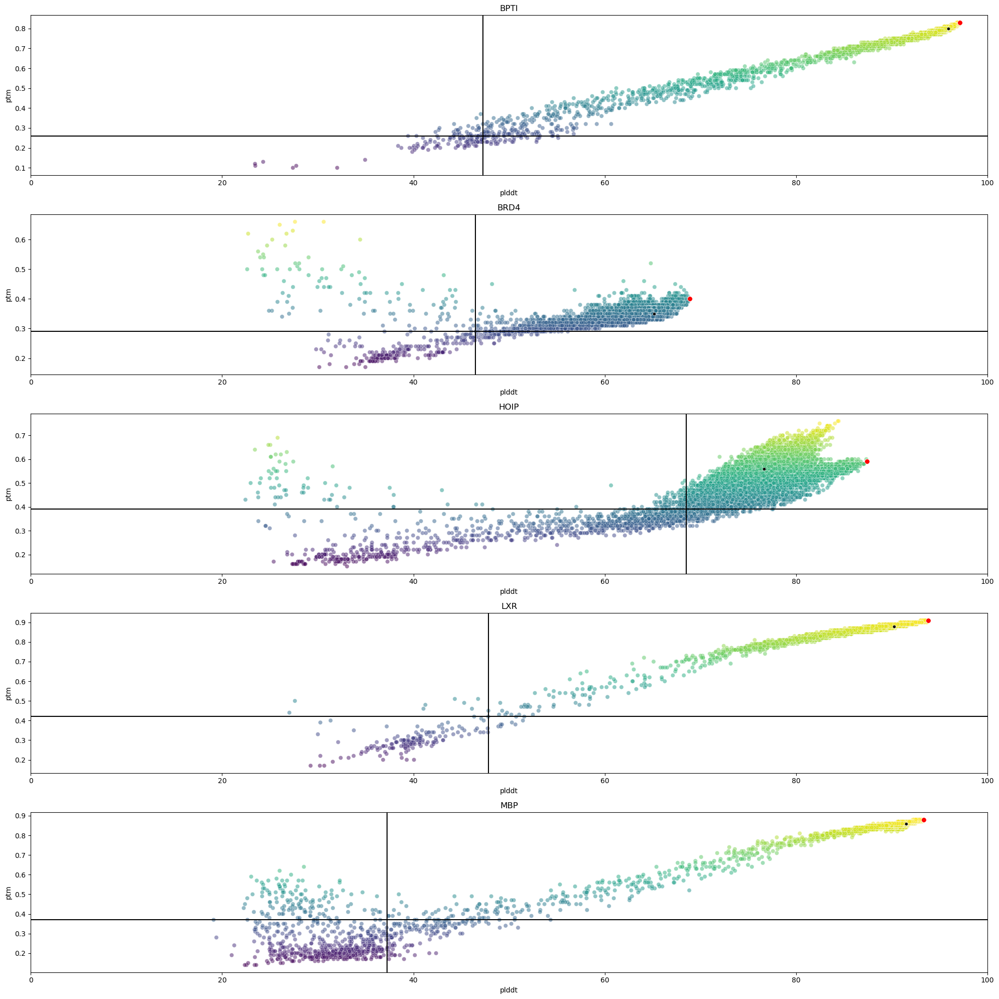

In [12]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np


# plot RMSD for each protein as a histogram

fig, ax = plt.subplots(len(protein_names), 1, figsize=(20, 20))


thresholds = conf_thresholds

for i, protein in enumerate(protein_names):
    contact_order = contact_order_df[contact_order_df["protein"] == protein]["contact_order"].values[0]
    print(contact_order.shape)
    print(protein)
    covariance = intra_residue_covariance_df[intra_residue_covariance_df["protein"] == protein]["intra_residue_covariance"].values[0]
    ptm = ptm_data[protein]

    # det = intra_residue_det_df[intra_residue_det_df["protein"] == protein]["intra_residue_det"].values[0]
    # det = det/ det[0]
    # # make det all positive
    # # det = np.abs(det)
    # det = np.log(det)
    # print(np.mean(det))

    if protein == "BRD4":
        ref_index = 1
    else:
        ref_index = 0
    plddt = plddt_data[protein]

    max_plddt_index = np.where(plddt == np.max(plddt))
    # print(len(det))

    sns.scatterplot(x=plddt, y=ptm, ax=ax[i], alpha=0.5, c=ptm, cmap='viridis')
    # plot the 0th as a black dot
    sns.scatterplot(x=[plddt[ref_index]], y=[ptm[ref_index]], ax=ax[i], c="black",s=20)
    sns.scatterplot(x=plddt[max_plddt_index], y=ptm[max_plddt_index], ax=ax[i], c="red",s=50)
    # min_threshold
    ptm_threshold = np.percentile(ptm,thresholds[i][0])
    # max_threshold = np.percentile(plddt,100)
    plddt_threshold =np.percentile(plddt,thresholds[i][0])
    # ax[i].axvline(50)
    ax[i].axvline(plddt_threshold, c="black")

    ax[i].axhline(ptm_threshold, c="black")

    print(ptm_threshold)
    # print(np.min(contact_order))
    ax[i].set_title(protein)
    ax[i].set_xlabel("plddt")
    ax[i].set_ylabel("ptm")
    # ax[i].set_xscale("log")
    ax[i].set_xlim(0,100)


plt.tight_layout()

plt.show() 

(12700,)
BPTI
(12700,)
BRD4
(12700,)
HOIP
(12700,)
LXR
(12700,)
MBP


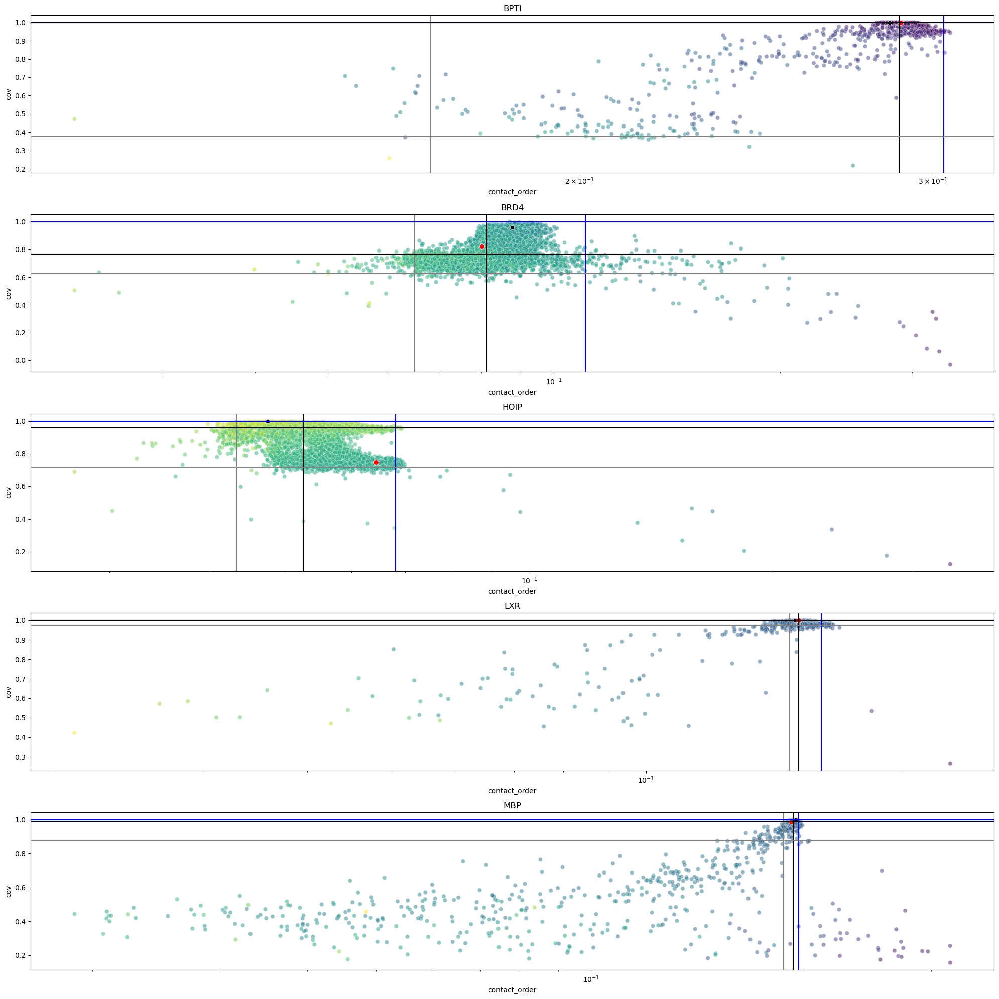

In [13]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np


# plot RMSD for each protein as a histogram
conf_thresholds = conf_thresholds

fig, ax = plt.subplots(len(protein_names), 1, figsize=(20, 20))
thresholds = con_thresholds
cov_thresholds = cov_thresholds

for i, protein in enumerate(protein_names):
    contact_order = contact_order_df[contact_order_df["protein"] == protein]["contact_order"].values[0]
    print(contact_order.shape)
    print(protein)
    intra_res = intra_residue_dist_df[intra_residue_dist_df["protein"]==protein]["intra_residue_dist"].values[0]
    covariance = intra_residue_covariance_df[intra_residue_covariance_df["protein"] == protein]["intra_residue_covariance"].values[0]
    plddt = plddt_data[protein]
    max_pae = max_pae_data[protein]
    ptm = ptm_data[protein]
    # det = intra_residue_det_df[intra_residue_det_df["protein"] == protein]["intra_residue_det"].values[0]
    # det = det/ det[0]
    # # make det all positive
    # # det = np.abs(det)
    # det = np.log(det)
    # print(np.mean(det))
    plddt = plddt_data[protein]
    # ptm = 
    # print(len(det))    
    if protein == "BRD4":
        ref_index = 1
    else:
        ref_index = 0
    plddt = plddt_data[protein]

    max_plddt_index = np.where(plddt == np.max(plddt))


    plddt_threshold = np.percentile(plddt,conf_thresholds[i][0])
    ptm_threshold =  np.percentile(ptm,conf_thresholds[i][0])
    
        # Create a mask for plddt values below the threshold
    plddt_mask = (plddt > plddt_threshold)

    # Create a mask for ptm values below the threshold
    ptm_mask = (ptm > ptm_threshold)

    # Combine the masks using logical o
    combined_mask = np.logical_or(plddt_mask,ptm_mask)

    masked_contact_order = contact_order[combined_mask]
    masked_covariance = covariance[combined_mask]




    sns.scatterplot(x=masked_contact_order, y=masked_covariance, ax=ax[i], alpha=0.5, c=intra_res[combined_mask], cmap='viridis')
    # plot the 0th as a black dot
    sns.scatterplot(x=[contact_order[ref_index]], y=[covariance[ref_index]], ax=ax[i], c="black")
    sns.scatterplot(x=contact_order[max_plddt_index], y=covariance[max_plddt_index], ax=ax[i], c="red",s=50)

    max_threshold = np.percentile(masked_contact_order,thresholds[i][1])
    min_threshold = np.percentile(masked_contact_order,thresholds[i][0])

    med_threshold =np.percentile(masked_contact_order,50)
    ax[i].axvline(max_threshold,c="blue")
    ax[i].axvline(min_threshold,c="grey")
    ax[i].axvline(med_threshold,c="black")


    max_threshold = np.percentile(masked_covariance,100)
    min_threshold = np.percentile(masked_covariance,cov_thresholds[i][0])

    med_threshold =np.percentile(masked_covariance,50)
    ax[i].axhline(max_threshold,c="blue")
    ax[i].axhline(min_threshold,c="grey")
    ax[i].axhline(med_threshold,c="black")



    ax[i].set_title(protein)
    ax[i].set_xlabel("contact_order")
    ax[i].set_ylabel("cov")
    # ax[i].set_xscale("log")
    ax[i].set_xscale("log")


plt.tight_layout()

plt.show() 

In [14]:
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Create a 3D plot for each protein
fig = make_subplots(
    rows=len(protein_names), cols=1,
    specs=[[{'type': 'scatter'}] for _ in range(len(protein_names))],  # Changed 'scene' to 'scatter'
    subplot_titles=protein_names,
    vertical_spacing=0.05
)





for i, protein in enumerate(protein_names):
    intra_residue_dists = intra_residue_dist_df[intra_residue_dist_df["protein"]==protein]["intra_residue_dist"].values[0]
    rmsd = RMSD_df[RMSD_df["protein"] == protein]["RMSD"].values[0]
    plddt = plddt_data[protein]
    max_pae = max_pae_data[protein]
    ptm = ptm_data[protein]
    c = contact_order_df[contact_order_df["protein"] == protein]["contact_order"].values[0]
    covariance = intra_residue_covariance_df[intra_residue_covariance_df["protein"] == protein]["intra_residue_covariance"].values[0]
    pca = pca_df[pca_df["protein"]==protein]["pca"].values[0]


   
    plddt_threshold = np.percentile(plddt,conf_thresholds[i][0])
    ptm_threshold =  np.percentile(ptm,conf_thresholds[i][0])
    


    # labels = []    
    # for idx, pt in enumerate(ptm):
    #     pl = plddt[idx]
    #     con = contact_order[idx]
    #     cov = covariance[idx]

    #     if (pl < plddt_threshold and pt < ptm_threshold):
    #         label = 0
    #     elif (con < min_con) or (con > max_con):
    #         label = 0
    #     elif(cov < min_cov):
    #         label = 0
    #     # elif pt < ptm_threshold:
    #     #     label = 0.4
    #     else:
    #         label = 1
     
    #     labels.append(label)
    # labels = np.array(labels)

    plddt_threshold = np.percentile(plddt,conf_thresholds[i][0])
    ptm_threshold =  np.percentile(ptm,conf_thresholds[i][0])
    
        # Create a mask for plddt values below the threshold
    plddt_mask = (plddt > plddt_threshold)

    # Create a mask for ptm values below the threshold
    ptm_mask = (ptm > ptm_threshold)

    # Combine the masks using logical o
    combined_mask = np.logical_or(plddt_mask,ptm_mask)

    masked_contact_order = contact_order[combined_mask]
    masked_covariance = covariance[combined_mask]
    masked_intra_residue_dists = intra_residue_dists[combined_mask]
    # masked_pca = pca[combined_mask]

    max_cov = np.percentile(covariance,100)
    mean_cov = np.mean(covariance)

    min_cov = np.percentile(covariance,1)
    # print(max_cov)
    # print(min_cov)
    cov_threshold = np.percentile(masked_covariance,cov_thresholds[i][0])

    median_con = np.median(masked_contact_order)
    mean_con = np.mean(masked_contact_order)
    max_con = np.percentile(masked_contact_order, con_thresholds[i][1])
    mean_con = np.mean(masked_contact_order)

    min_con = np.percentile(masked_contact_order,con_thresholds[i][0])

    min_con_mask = (masked_contact_order > min_con)
    max_con_mask = (masked_contact_order < max_con)

    con_mask = np.logical_and(min_con_mask,max_con_mask)

    cov_mask = (masked_covariance > cov_threshold)

    con_cov_mask = np.logical_or(con_mask,cov_mask)


    masked_intra_residue_dists = intra_residue_dists[combined_mask][con_cov_mask]


    min_dist =  np.percentile(masked_intra_residue_dists,res_thresholds[i][0])
    max_dist = np.percentile(masked_intra_residue_dists,res_thresholds[i][1])
    
    min_dist_mask = (masked_intra_residue_dists > min_dist)
    max_dist_mask = (masked_intra_residue_dists < max_dist)


    dist_mask = np.logical_and(min_dist_mask,max_dist_mask)

    # dist_con_cov_mask = np.logical_or(dist_mask,con_cov_mask)
    feats_all = pca
    
    _pca= pca[combined_mask][con_cov_mask]

    pca1 = _pca[:,0]
    pca2 = _pca[:,1]
    

    trace = go.Scatter(
        x=pca1,
        y=pca2,
        mode='markers',
        marker=dict(
            size=5,
            color=covariance[combined_mask][con_cov_mask],
            colorscale='Viridis',
            opacity=0.5,
            colorbar=dict(  # Added colorbar
                title='Label',
                len=0.8,
                thickness=20,
            )
        ),
        name=protein,
        hovertemplate='Element: %{pointNumber}<br>PCA1: %{x:.2f}<br>PCA2: %{y:.2f}<extra></extra>'
    )

    fig.add_trace(trace, row=i+1, col=1)
    
    anti_pca = pca[combined_mask][con_cov_mask][~dist_mask]


    trace = go.Scatter(
        x=anti_pca[:,0],
        y=anti_pca[:,1],
        mode='markers',
        marker=dict(
            size=5,
            color="Grey",
            # colorscale='Viridis',
            opacity=0.5,
            colorbar=dict(  # Added colorbar
                title='Label',
                len=0.8,
                thickness=20,
            )
        ),
        name=protein,
        hovertemplate='Element: %{pointNumber}<br>PCA1: %{x:.2f}<br>PCA2: %{y:.2f}<extra></extra>'
    )

    fig.add_trace(trace, row=i+1, col=1)
    


    fig.update_xaxes(title_text='PCA1', row=i+1, col=1)  # Updated axis title
    fig.update_yaxes(title_text='PCA2', row=i+1, col=1)  # Updated axis title

fig.update_layout(
    height=300 * len(protein_names),
    width=800,
    title_text='2D Scatter Plot of PCA1 and PCA2',
    showlegend=False
)

fig.show()

In [15]:
# plot PCA of all data for each protein coloured by each of the features: plddt, contact_order, cov, intra_residue_dist


In [16]:
from sklearn.cluster import KMeans

all_masks_frames = {}
all_masks_labels = {}
all_masks_indexes = {}
con_cov_masks_frames = {}
conf_masks_frames = {}
no_mask_frames = {}


for i, protein in enumerate(protein_names):
    intra_residue_dists = intra_residue_dist_df[intra_residue_dist_df["protein"]==protein]["intra_residue_dist"].values[0]
    rmsd = RMSD_df[RMSD_df["protein"] == protein]["RMSD"].values[0]
    plddt = plddt_data[protein]
    max_pae = max_pae_data[protein]
    ptm = ptm_data[protein]
    c = contact_order_df[contact_order_df["protein"] == protein]["contact_order"].values[0]
    covariance = intra_residue_covariance_df[intra_residue_covariance_df["protein"] == protein]["intra_residue_covariance"].values[0]
    pca = pca_df[pca_df["protein"]==protein]["pca"].values[0]
    pca1 = pca[:,0]
    pca2 = pca[:,1]
    

   
    plddt_threshold = np.percentile(plddt,conf_thresholds[i][0])
    ptm_threshold =  np.percentile(ptm,conf_thresholds[i][0])
    


    # labels = []    
    # for idx, pt in enumerate(ptm):
    #     pl = plddt[idx]
    # Rest of the code...
    feats= pca[combined_mask][con_cov_mask][dist_mask]

    

    feats_con = pca[combined_mask][con_cov_mask]

    feats_conf = pca[combined_mask]

    # feat2 = pca2[combined_mask][con_cov_mask][dist_mask]



    kmeans = KMeans(n_clusters=k_clusters, random_state=42)

    kmeans.fit(feats_all)

    # Get the cluster centers
    cluster_centers = kmeans.cluster_centers_

    # Find the closest frames to each cluster center
    closest_frames = kmeans.transform(feats_all).argmin(axis=0)

    no_mask_frames[protein] = closest_frames


    kmeans.fit(feats_con)

    # Get the cluster centers
    cluster_centers = kmeans.cluster_centers_

    # Find the closest frames to each cluster center
    closest_frames = kmeans.transform(feats_con).argmin(axis=0)

    con_cov_masks_frames[protein] = closest_frames




    kmeans.fit(feats_conf)

    # Get the cluster centers
    cluster_centers = kmeans.cluster_centers_

    # Find the closest frames to each cluster center
    closest_frames = kmeans.transform(feats_conf).argmin(axis=0)

    conf_masks_frames[protein] = closest_frames






    kmeans.fit(feats)

    # Get the cluster centers
    cluster_centers = kmeans.cluster_centers_

    # Find the closest frames to each cluster center
    closest_frames = kmeans.transform(feats).argmin(axis=0)

    all_masks_frame_indexes = np.where(combined_mask)[0][con_cov_mask][dist_mask]

    all_masks_indexes[protein] = all_masks_frame_indexes

    all_masks_frames[protein] = closest_frames
    all_masks_labels[protein] = kmeans.labels_
    # Print the indices of the closest frames for each cluster center
    for i, frame_idx in enumerate(closest_frames):
        print(f"Cluster {i+1}: Frame {frame_idx}")





/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



Cluster 1: Frame 2315
Cluster 2: Frame 11035
Cluster 3: Frame 10928
Cluster 4: Frame 10743
Cluster 5: Frame 11129
Cluster 6: Frame 11042
Cluster 7: Frame 10887
Cluster 8: Frame 11565
Cluster 9: Frame 10935
Cluster 10: Frame 10952
Cluster 11: Frame 934
Cluster 12: Frame 10877
Cluster 13: Frame 11051
Cluster 14: Frame 10332
Cluster 15: Frame 5174
Cluster 16: Frame 10888
Cluster 17: Frame 11038
Cluster 18: Frame 10360
Cluster 19: Frame 10752
Cluster 20: Frame 3781


/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



Cluster 1: Frame 9738
Cluster 2: Frame 9788
Cluster 3: Frame 8717
Cluster 4: Frame 10586
Cluster 5: Frame 4767
Cluster 6: Frame 2414
Cluster 7: Frame 7204
Cluster 8: Frame 6262
Cluster 9: Frame 8131
Cluster 10: Frame 10171
Cluster 11: Frame 880
Cluster 12: Frame 8999
Cluster 13: Frame 3538
Cluster 14: Frame 2296
Cluster 15: Frame 1516
Cluster 16: Frame 6418
Cluster 17: Frame 7695
Cluster 18: Frame 7517
Cluster 19: Frame 2919
Cluster 20: Frame 3870


/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



Cluster 1: Frame 11581
Cluster 2: Frame 6757
Cluster 3: Frame 5738
Cluster 4: Frame 3600
Cluster 5: Frame 10033
Cluster 6: Frame 11584
Cluster 7: Frame 9004
Cluster 8: Frame 6944
Cluster 9: Frame 1549
Cluster 10: Frame 8215
Cluster 11: Frame 5836
Cluster 12: Frame 3166
Cluster 13: Frame 10296
Cluster 14: Frame 218
Cluster 15: Frame 7831
Cluster 16: Frame 11376
Cluster 17: Frame 10836
Cluster 18: Frame 9503
Cluster 19: Frame 1066
Cluster 20: Frame 9943


/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



Cluster 1: Frame 7551
Cluster 2: Frame 11532
Cluster 3: Frame 3737
Cluster 4: Frame 10609
Cluster 5: Frame 1788
Cluster 6: Frame 10421
Cluster 7: Frame 2361
Cluster 8: Frame 10441
Cluster 9: Frame 4230
Cluster 10: Frame 6220
Cluster 11: Frame 9648
Cluster 12: Frame 10337
Cluster 13: Frame 3646
Cluster 14: Frame 693
Cluster 15: Frame 675
Cluster 16: Frame 3147
Cluster 17: Frame 10496
Cluster 18: Frame 11071
Cluster 19: Frame 7368
Cluster 20: Frame 11460


/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



Cluster 1: Frame 7559
Cluster 2: Frame 10868
Cluster 3: Frame 454
Cluster 4: Frame 3631
Cluster 5: Frame 4766
Cluster 6: Frame 11464
Cluster 7: Frame 7047
Cluster 8: Frame 3091
Cluster 9: Frame 9751
Cluster 10: Frame 1089
Cluster 11: Frame 5429
Cluster 12: Frame 879
Cluster 13: Frame 6871
Cluster 14: Frame 11475
Cluster 15: Frame 8898
Cluster 16: Frame 2371
Cluster 17: Frame 375
Cluster 18: Frame 9785
Cluster 19: Frame 10150
Cluster 20: Frame 1625


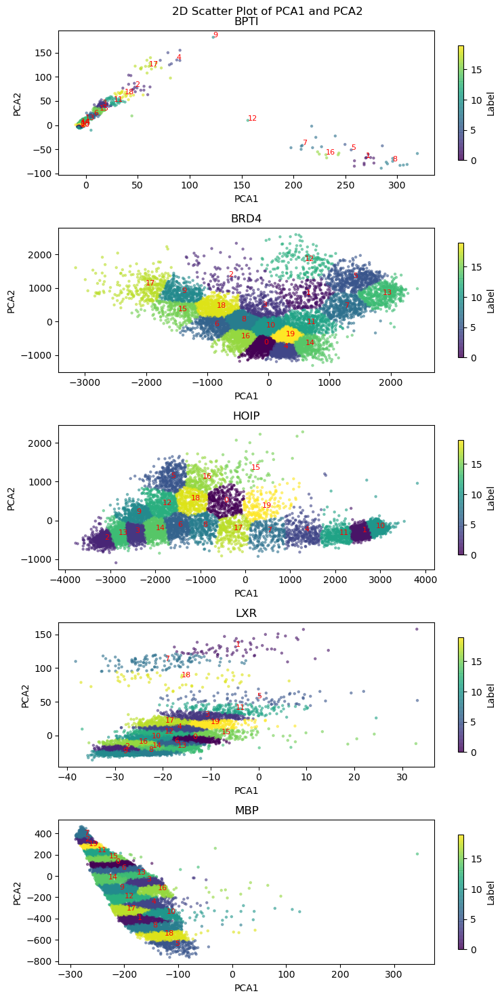

In [17]:
import matplotlib.pyplot as plt
import numpy as np

# Create a 2D plot for each protein
fig, axes = plt.subplots(len(protein_names), 1, figsize=(8, 3*len(protein_names)), sharex=False, sharey=False)
fig.tight_layout(pad=3.0)

for i, protein in enumerate(protein_names):
    intra_residue_dists = intra_residue_dist_df[intra_residue_dist_df["protein"]==protein]["intra_residue_dist"].values[0]
    rmsd = RMSD_df[RMSD_df["protein"] == protein]["RMSD"].values[0]
    plddt = plddt_data[protein]
    max_pae = max_pae_data[protein]
    ptm = ptm_data[protein]



    
    c = contact_order_df[contact_order_df["protein"] == protein]["contact_order"].values[0]
    covariance = intra_residue_covariance_df[intra_residue_covariance_df["protein"] == protein]["intra_residue_covariance"].values[0]
    pca = pca_df[pca_df["protein"]==protein]["pca"].values[0]
    frame_mask = all_masks_indexes[protein]
    labels = all_masks_labels[protein]

    _pca = pca[frame_mask]
    pca1 = _pca[:,0]
    pca2 = _pca[:,1]

    scatter = axes[i].scatter(pca1, pca2, c=labels, cmap='viridis', alpha=0.5, s=5)

    closest_frames = all_masks_frames[protein]
    if len(closest_frames) <= 25:
        # annotate each cluster_center with its cluster number
        for j, txt in enumerate(closest_frames):




            axes[i].annotate(j, (_pca[txt, 0], _pca[txt, 1]), fontsize=8, color='red')


            # axes[i].annotate(i, (new_cluster_centers[i, 0], new_cluster_centers[i, 1]), fontsize=8, color='red')
        



    axes[i].set_title(protein)
    axes[i].set_xlabel('PCA1')
    axes[i].set_ylabel('PCA2')

    # Add colorbar
    
    cbar = fig.colorbar(scatter, ax=axes[i], shrink=0.8)
    cbar.set_label('Label')

fig.suptitle('2D Scatter Plot of PCA1 and PCA2')
plt.tight_layout()
plt.show()

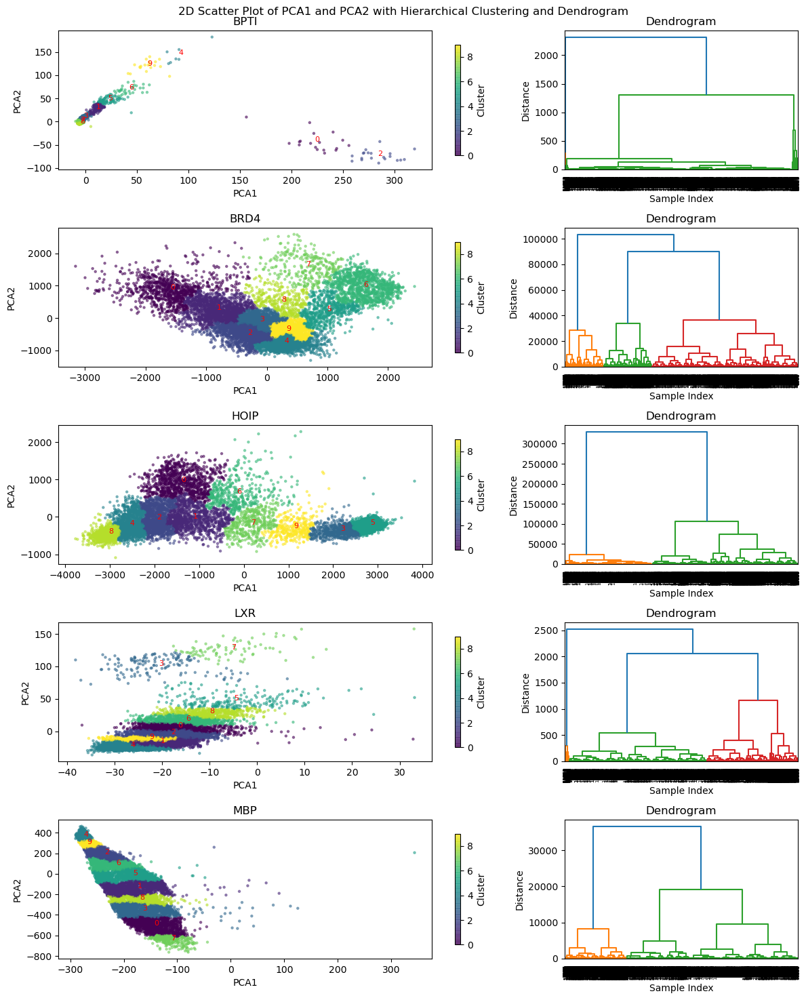

In [18]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage

# Create subplots for the scatter plot and dendrogram
fig = plt.figure(figsize=(12, 3*len(protein_names)))
gs = fig.add_gridspec(len(protein_names), 2, width_ratios=[2, 1])

for i, protein in enumerate(protein_names):
    intra_residue_dists = intra_residue_dist_df[intra_residue_dist_df["protein"]==protein]["intra_residue_dist"].values[0]
    rmsd = RMSD_df[RMSD_df["protein"] == protein]["RMSD"].values[0]
    plddt = plddt_data[protein]
    max_pae = max_pae_data[protein]
    ptm = ptm_data[protein]
    c = contact_order_df[contact_order_df["protein"] == protein]["contact_order"].values[0]
    covariance = intra_residue_covariance_df[intra_residue_covariance_df["protein"] == protein]["intra_residue_covariance"].values[0]
    pca = pca_df[pca_df["protein"]==protein]["pca"].values[0]
    frame_mask = all_masks_indexes[protein]
    
    # Extract the PCA features for the frame_mask indices
    _pca = pca[frame_mask]
    
    # Perform hierarchical clustering
    n_clusters = 10  # Specify the desired number of clusters
    linkage_matrix = linkage(_pca, method='ward')
    hierarchical = AgglomerativeClustering(n_clusters=n_clusters)
    labels = hierarchical.fit_predict(_pca)
    
    # Create scatter plot
    ax_scatter = fig.add_subplot(gs[i, 0])
    pca1 = _pca[:,0]
    pca2 = _pca[:,1]
    scatter = ax_scatter.scatter(pca1, pca2, c=labels, cmap='viridis', alpha=0.5, s=5)
    
    # Annotate each cluster center with its cluster number
    cluster_centers = []
    for j in range(n_clusters):
        cluster_points = _pca[labels == j]
        cluster_center = np.mean(cluster_points, axis=0)
        cluster_centers.append(cluster_center)
        ax_scatter.annotate(j, (cluster_center[0], cluster_center[1]), fontsize=8, color='red')
    
    ax_scatter.set_title(protein)
    ax_scatter.set_xlabel('PCA1')
    ax_scatter.set_ylabel('PCA2')
    
    # Add colorbar
    cbar = fig.colorbar(scatter, ax=ax_scatter, shrink=0.8)
    cbar.set_label('Cluster')
    
    # Create dendrogram
    ax_dendrogram = fig.add_subplot(gs[i, 1])
    dendrogram(linkage_matrix, ax=ax_dendrogram)
    ax_dendrogram.set_title('Dendrogram')
    ax_dendrogram.set_xlabel('Sample Index')
    ax_dendrogram.set_ylabel('Distance')

fig.suptitle('2D Scatter Plot of PCA1 and PCA2 with Hierarchical Clustering and Dendrogram')
plt.tight_layout()
plt.show()

In [19]:
import numpy as np
from scipy.spatial.distance import pdist, squareform
from scipy.stats import pearsonr
from MDAnalysis.analysis.align import AlignTraj

def calc_intra_residue_cross_correlation(universe, frame_indexes, residues:list=None):
    """
    After aligning the trajectory in memory, calculate the cross correlation
    of the intra-residue distances between the specified frame indexes.
    """
    sel = "protein and name CA"
    if residues is not None:
        resi_sel = " or ".join([f" resid {res}" for res in residues])
        sel = sel + f" and ({resi_sel})"

    ref = universe.select_atoms(sel)

    # Align the trajectory to the first frame
    alignment = AlignTraj(universe, ref, select=sel, in_memory=True).run()

    n_frames = len(frame_indexes)
    n_residues = len(ref.residues)

    # Calculate the intra-residue distance matrices for the specified frames
    dist_matrices = []
    for frame_index in frame_indexes:
        universe.trajectory[frame_index]
        coords = ref.positions
        dist_matrix = squareform(pdist(coords))
        dist_matrices.append(dist_matrix)

    # Calculate the cross correlation between the specified frames
    cross_correlation_matrix = np.zeros((n_frames, n_frames))
    for i in range(n_frames):
        for j in range(n_frames):
            cross_correlation_matrix[i, j] = pearsonr(dist_matrices[i].flatten(), dist_matrices[j].flatten())[0]

    return cross_correlation_matrix

# ... (rest of the code remains the same)


/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:300: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:301: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:302: RuntimeWarning:

invalid value encountered in scalar divide



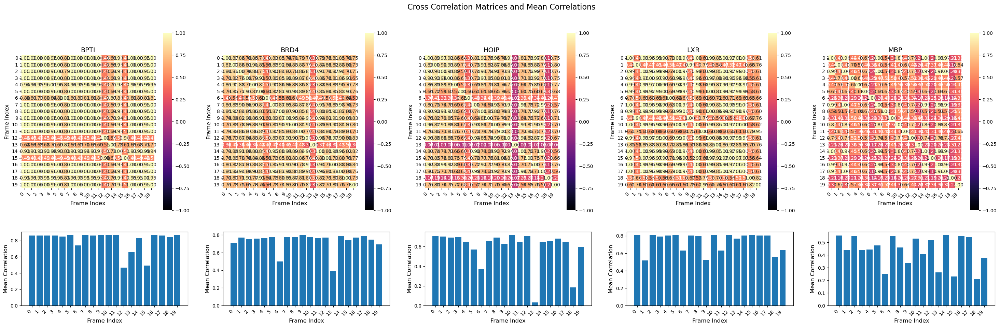

In [20]:

no_maskintra_residue_cross_correlation_df = pd.DataFrame()

for protein in protein_names:
    frame_indexes = no_mask_frames[protein]
      # Specify the frame indexes for cross correlation calculation
    residues = res_data[protein]
    universe = mda.Universe(proteins[protein]["top"], proteins[protein]["traj"])
    intra_residue_cross_correlation = calc_intra_residue_cross_correlation(universe, frame_indexes, residues=residues)
    df_to_add = pd.DataFrame({"protein": protein, "intra_residue_cross_correlation": [intra_residue_cross_correlation]})
    no_maskintra_residue_cross_correlation_df = pd.concat([no_maskintra_residue_cross_correlation_df, df_to_add], axis=0)



import seaborn as sns
import matplotlib.pyplot as plt

# Create a single figure with subplots for each protein
n_proteins = len(protein_names)
fig, axes = plt.subplots(2, n_proteins, figsize=(6 * n_proteins, 10), gridspec_kw={'height_ratios': [3, 1]})

for i, protein in enumerate(protein_names):
    cross_correlation_matrix = no_maskintra_residue_cross_correlation_df[no_maskintra_residue_cross_correlation_df["protein"] == protein]["intra_residue_cross_correlation"].values[0]
    row_sum = np.sum(cross_correlation_matrix, axis=1)
    mean_rows = [(row - 1) / len(row_sum) for row in row_sum]

    # Plot the heatmap on the corresponding subplot
    sns.heatmap(cross_correlation_matrix, cmap="magma", vmin=-1, vmax=1, annot=True, fmt=".2f", square=True,
                linewidths=0.5, cbar_kws={"shrink": 0.8}, ax=axes[0, i])

    # Set the title and labels for each heatmap subplot
    axes[0, i].set_title(f"{protein}", fontsize=14)
    axes[0, i].set_xlabel("Frame Index", fontsize=12)
    axes[0, i].set_ylabel("Frame Index", fontsize=12)

    # Rotate the x-tick labels for better readability
    axes[0, i].set_xticklabels(axes[0, i].get_xticklabels(), rotation=45, ha='right', fontsize=10)
    axes[0, i].set_yticklabels(axes[0, i].get_yticklabels(), rotation=0, fontsize=10)

    # Plot the mean row as a bar chart on the corresponding subplot
    axes[1, i].bar(range(len(mean_rows)), mean_rows)
    axes[1, i].set_xlabel("Frame Index", fontsize=12)
    axes[1, i].set_ylabel("Mean Correlation", fontsize=12)
    axes[1, i].set_xticks(range(len(mean_rows)))
    axes[1, i].set_xticklabels(range(len(mean_rows)), rotation=45, ha='right', fontsize=10)

# Adjust the spacing between subplots
plt.tight_layout(pad=3.0)

# Add a main title for the entire figure
fig.suptitle("Cross Correlation Matrices and Mean Correlations", fontsize=16)

# Display the plot
plt.show()

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:300: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:301: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:302: RuntimeWarning:

invalid value encountered in scalar divide



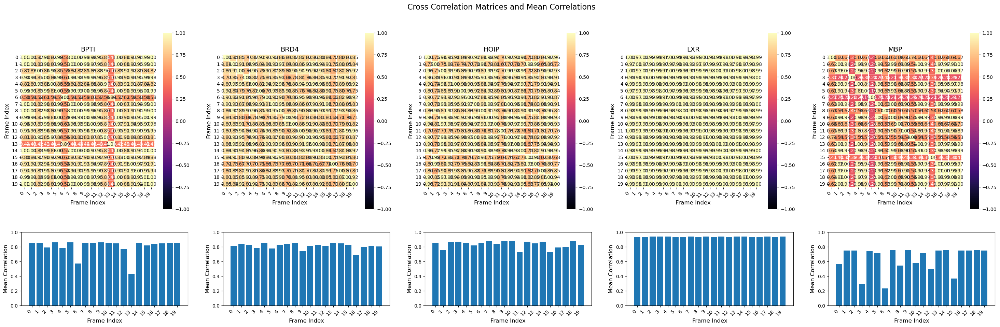

In [21]:

confmask_intra_residue_cross_correlation_df = pd.DataFrame()

for protein in protein_names:
    frame_indexes = conf_masks_frames[protein]
      # Specify the frame indexes for cross correlation calculation
    residues = res_data[protein]
    universe = mda.Universe(proteins[protein]["top"], proteins[protein]["traj"])
    intra_residue_cross_correlation = calc_intra_residue_cross_correlation(universe, frame_indexes, residues=residues)
    df_to_add = pd.DataFrame({"protein": protein, "intra_residue_cross_correlation": [intra_residue_cross_correlation]})
    confmask_intra_residue_cross_correlation_df = pd.concat([confmask_intra_residue_cross_correlation_df, df_to_add], axis=0)

import seaborn as sns
import matplotlib.pyplot as plt

# Create a single figure with subplots for each protein
n_proteins = len(protein_names)
fig, axes = plt.subplots(2, n_proteins, figsize=(6 * n_proteins, 10), gridspec_kw={'height_ratios': [3, 1]})

for i, protein in enumerate(protein_names):
    cross_correlation_matrix = confmask_intra_residue_cross_correlation_df[confmask_intra_residue_cross_correlation_df["protein"] == protein]["intra_residue_cross_correlation"].values[0]
    row_sum = np.sum(cross_correlation_matrix, axis=1)
    mean_rows = [(row - 1) / len(row_sum) for row in row_sum]

    # Plot the heatmap on the corresponding subplot
    sns.heatmap(cross_correlation_matrix, cmap="magma", vmin=-1, vmax=1, annot=True, fmt=".2f", square=True,
                linewidths=0.5, cbar_kws={"shrink": 0.8}, ax=axes[0, i])

    # Set the title and labels for each heatmap subplot
    axes[0, i].set_title(f"{protein}", fontsize=14)
    axes[0, i].set_xlabel("Frame Index", fontsize=12)
    axes[0, i].set_ylabel("Frame Index", fontsize=12)

    # Rotate the x-tick labels for better readability
    axes[0, i].set_xticklabels(axes[0, i].get_xticklabels(), rotation=45, ha='right', fontsize=10)
    axes[0, i].set_yticklabels(axes[0, i].get_yticklabels(), rotation=0, fontsize=10)

    # Plot the mean row as a bar chart on the corresponding subplot
    axes[1, i].bar(range(len(mean_rows)), mean_rows)
    axes[1, i].set_xlabel("Frame Index", fontsize=12)
    axes[1, i].set_ylabel("Mean Correlation", fontsize=12)
    axes[1, i].set_ylim(0,1)

    axes[1, i].set_xticks(range(len(mean_rows)))
    axes[1, i].set_xticklabels(range(len(mean_rows)), rotation=45, ha='right', fontsize=10)

# Adjust the spacing between subplots
plt.tight_layout(pad=3.0)

# Add a main title for the entire figure
fig.suptitle("Cross Correlation Matrices and Mean Correlations", fontsize=16)

# Display the plot
plt.show()

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:300: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:301: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:302: RuntimeWarning:

invalid value encountered in scalar divide



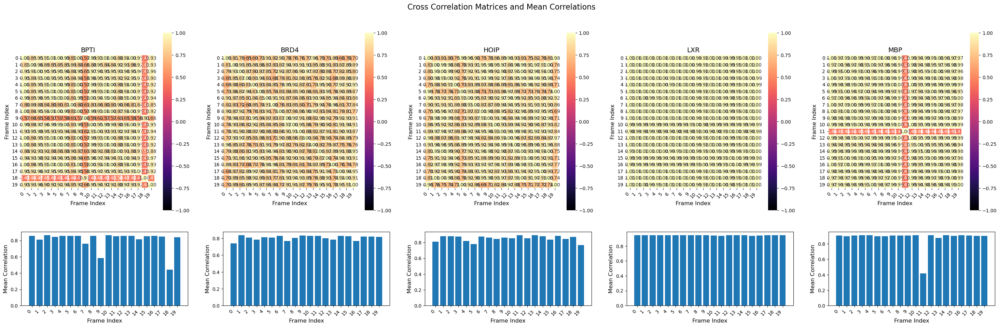

In [22]:

con_cov_intra_residue_cross_correlation_df = pd.DataFrame()

for protein in protein_names:
    frame_indexes = con_cov_masks_frames[protein]
      # Specify the frame indexes for cross correlation calculation
    residues = res_data[protein]
    universe = mda.Universe(proteins[protein]["top"], proteins[protein]["traj"])
    intra_residue_cross_correlation = calc_intra_residue_cross_correlation(universe, frame_indexes, residues=residues)
    df_to_add = pd.DataFrame({"protein": protein, "intra_residue_cross_correlation": [intra_residue_cross_correlation]})
    con_cov_intra_residue_cross_correlation_df = pd.concat([con_cov_intra_residue_cross_correlation_df, df_to_add], axis=0)

import seaborn as sns
import matplotlib.pyplot as plt

# Create a single figure with subplots for each protein
n_proteins = len(protein_names)
fig, axes = plt.subplots(2, n_proteins, figsize=(6 * n_proteins, 10), gridspec_kw={'height_ratios': [3, 1]})

for i, protein in enumerate(protein_names):
    cross_correlation_matrix = con_cov_intra_residue_cross_correlation_df[con_cov_intra_residue_cross_correlation_df["protein"] == protein]["intra_residue_cross_correlation"].values[0]
    row_sum = np.sum(cross_correlation_matrix, axis=1)
    mean_rows = [(row - 1) / len(row_sum) for row in row_sum]

    # Plot the heatmap on the corresponding subplot
    sns.heatmap(cross_correlation_matrix, cmap="magma", vmin=-1, vmax=1, annot=True, fmt=".2f", square=True,
                linewidths=0.5, cbar_kws={"shrink": 0.8}, ax=axes[0, i])

    # Set the title and labels for each heatmap subplot
    axes[0, i].set_title(f"{protein}", fontsize=14)
    axes[0, i].set_xlabel("Frame Index", fontsize=12)
    axes[0, i].set_ylabel("Frame Index", fontsize=12)

    # Rotate the x-tick labels for better readability
    axes[0, i].set_xticklabels(axes[0, i].get_xticklabels(), rotation=45, ha='right', fontsize=10)
    axes[0, i].set_yticklabels(axes[0, i].get_yticklabels(), rotation=0, fontsize=10)

    # Plot the mean row as a bar chart on the corresponding subplot
    axes[1, i].bar(range(len(mean_rows)), mean_rows)
    axes[1, i].set_xlabel("Frame Index", fontsize=12)
    axes[1, i].set_ylabel("Mean Correlation", fontsize=12)
    axes[1, i].set_xticks(range(len(mean_rows)))
    axes[1, i].set_xticklabels(range(len(mean_rows)), rotation=45, ha='right', fontsize=10)

# Adjust the spacing between subplots
plt.tight_layout(pad=3.0)

# Add a main title for the entire figure
fig.suptitle("Cross Correlation Matrices and Mean Correlations", fontsize=16)

# Display the plot
plt.show()

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:300: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:301: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:302: RuntimeWarning:

invalid value encountered in scalar divide



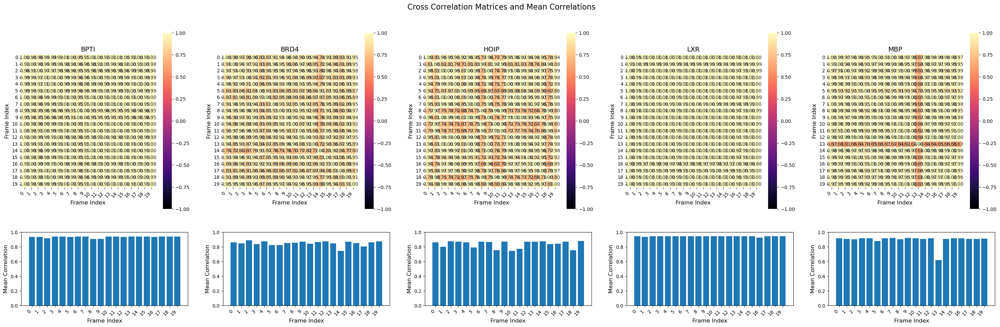

In [23]:

full_mask_intra_residue_cross_correlation_df = pd.DataFrame()

for protein in protein_names:
    frame_indexes = all_masks_frames[protein]
      # Specify the frame indexes for cross correlation calculation
    residues = res_data[protein]
    universe = mda.Universe(proteins[protein]["top"], proteins[protein]["traj"])
    intra_residue_cross_correlation = calc_intra_residue_cross_correlation(universe, frame_indexes, residues=residues)
    df_to_add = pd.DataFrame({"protein": protein, "intra_residue_cross_correlation": [intra_residue_cross_correlation]})
    full_mask_intra_residue_cross_correlation_df = pd.concat([full_mask_intra_residue_cross_correlation_df, df_to_add], axis=0)

import seaborn as sns
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Create a single figure with subplots for each protein
n_proteins = len(protein_names)
fig, axes = plt.subplots(2, n_proteins, figsize=(6 * n_proteins, 10), gridspec_kw={'height_ratios': [3, 1]})

for i, protein in enumerate(protein_names):
    cross_correlation_matrix = full_mask_intra_residue_cross_correlation_df[full_mask_intra_residue_cross_correlation_df["protein"] == protein]["intra_residue_cross_correlation"].values[0]
    row_sum = np.sum(cross_correlation_matrix, axis=1)
    mean_rows = [(row - 1) / len(row_sum) for row in row_sum]

    # Plot the heatmap on the corresponding subplot
    sns.heatmap(cross_correlation_matrix, cmap="magma", vmin=-1, vmax=1, annot=True, fmt=".2f", square=True,
                linewidths=0.5, cbar_kws={"shrink": 0.8}, ax=axes[0, i])

    # Set the title and labels for each heatmap subplot
    axes[0, i].set_title(f"{protein}", fontsize=14)
    axes[0, i].set_xlabel("Frame Index", fontsize=12)
    axes[0, i].set_ylabel("Frame Index", fontsize=12)

    # Rotate the x-tick labels for better readability
    axes[0, i].set_xticklabels(axes[0, i].get_xticklabels(), rotation=45, ha='right', fontsize=10)
    axes[0, i].set_yticklabels(axes[0, i].get_yticklabels(), rotation=0, fontsize=10)

    # Plot the mean row as a bar chart on the corresponding subplot
    axes[1, i].bar(range(len(mean_rows)), mean_rows)
    axes[1, i].set_xlabel("Frame Index", fontsize=12)
    axes[1, i].set_ylabel("Mean Correlation", fontsize=12)
    axes[1, i].set_xticks(range(len(mean_rows)))
    axes[1, i].set_xticklabels(range(len(mean_rows)), rotation=45, ha='right', fontsize=10)
    axes[1, i].set_ylim(0,1)

# Adjust the spacing between subplots
plt.tight_layout(pad=3.0)

# Add a main title for the entire figure
fig.suptitle("Cross Correlation Matrices and Mean Correlations", fontsize=16)

# Display the plot
plt.show()

BPTI
[ 2315 11035 10928 10743 11129 11042 10887 11565 10935 10952   934 10877
 11051 10332  5174 10888 11038 10360 10752  3781]


/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:300: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:301: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:302: RuntimeWarning:

invalid value encountered in scalar divide



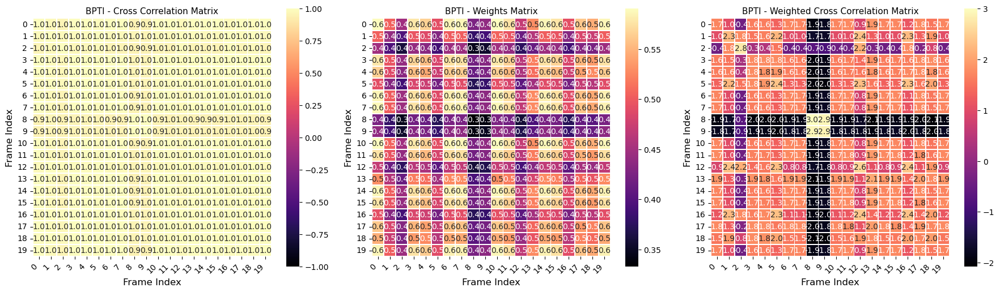

BRD4
[ 9738  9788  8717 10586  4767  2414  7204  6262  8131 10171   880  8999
  3538  2296  1516  6418  7695  7517  2919  3870]


/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:300: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:301: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:302: RuntimeWarning:

invalid value encountered in scalar divide



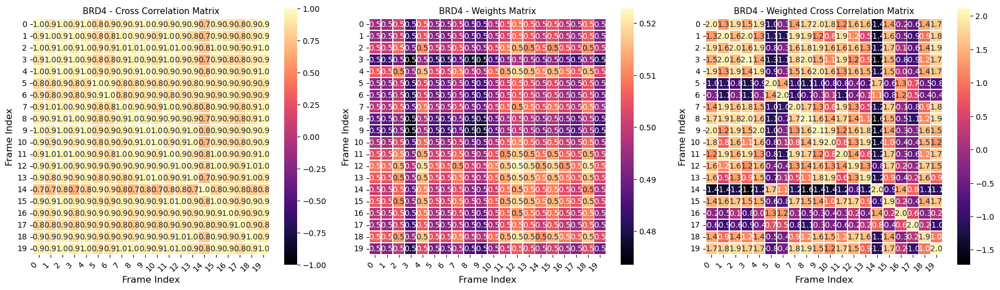

HOIP
[11581  6757  5738  3600 10033 11584  9004  6944  1549  8215  5836  3166
 10296   218  7831 11376 10836  9503  1066  9943]


/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:300: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:301: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:302: RuntimeWarning:

invalid value encountered in scalar divide



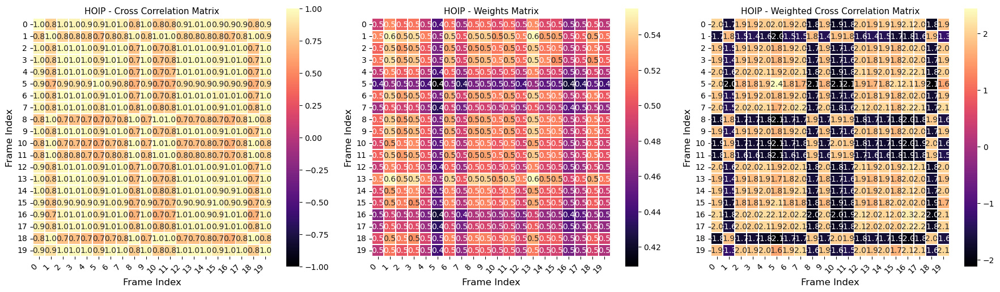

LXR
[ 7551 11532  3737 10609  1788 10421  2361 10441  4230  6220  9648 10337
  3646   693   675  3147 10496 11071  7368 11460]


/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:300: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:301: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:302: RuntimeWarning:

invalid value encountered in scalar divide



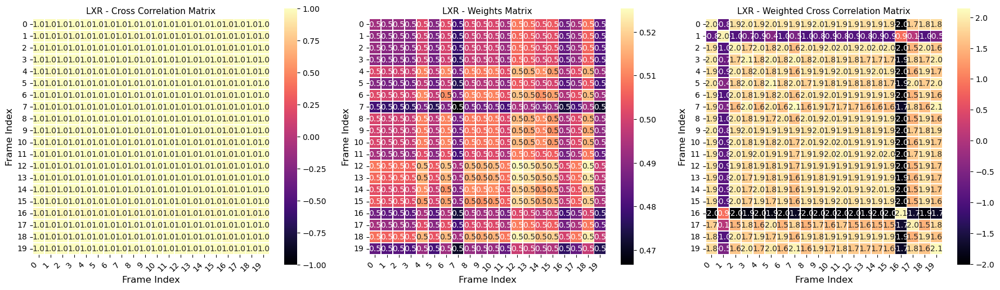

MBP
[ 7559 10868   454  3631  4766 11464  7047  3091  9751  1089  5429   879
  6871 11475  8898  2371   375  9785 10150  1625]


/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:300: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:301: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:302: RuntimeWarning:

invalid value encountered in scalar divide



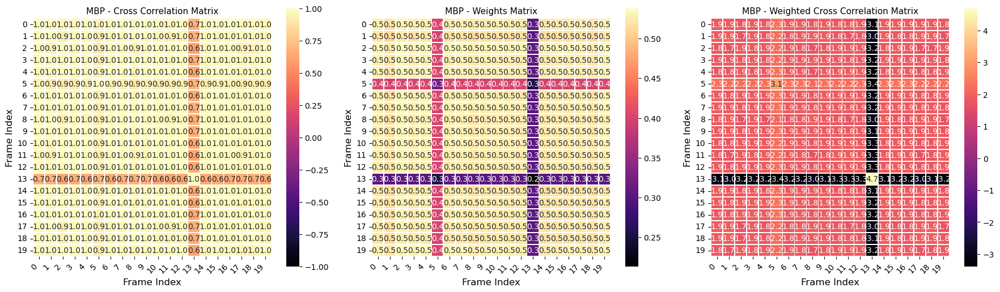

In [24]:

import datetime


def calc_intra_residue_cross_correlation(universe, frame_indexes, residues):
    sel = "protein and name CA"
    if residues is not None:
        resi_sel = " or ".join([f" resid {res}" for res in residues])
        sel = sel + f" and ({resi_sel})"

    if frame_indexes is None:
        frame_indexes = list(range(len(universe.trajectory)))


    ref = universe.select_atoms(sel)

    alignment = AlignTraj(universe, ref, select=sel, in_memory=True).run()

    n_frames = len(frame_indexes)
    n_residues = len(ref.residues)

    dist_matrices = []
    for frame_index in frame_indexes:
        universe.trajectory[frame_index]
        coords = ref.positions
        dist_matrix = squareform(pdist(coords))
        dist_matrices.append(dist_matrix)

    cross_correlation_matrix = np.zeros((n_frames, n_frames))
    for i in range(n_frames):
        for j in range(n_frames):
            cross_correlation_matrix[i, j] = pearsonr(dist_matrices[i].flatten(), dist_matrices[j].flatten())[0]

    return cross_correlation_matrix

def calc_weights_matrix(weights):

    n_frames = len(weights)

    weights_matrix = np.zeros((n_frames, n_frames))
    for i in range(n_frames):
        for j in range(n_frames):
            weights_ij = np.outer(weights[i], weights[j])[0][0]
            sum_weights = np.sum([weights[i], weights[j]])
            weights_matrix[i, j] = (float(weights_ij)/sum_weights) 

    return weights_matrix

def calc_weighted_intra_residue_cross_correlation(cross_correlation_matrix, weights):
    n_frames = len(weights)
    dist_matrices = []

    weighted_cross_correlation_matrix = np.zeros((n_frames, n_frames))
    for i in range(n_frames):
        for j in range(n_frames):
            weights_ij = np.outer(weights[i], weights[j])[0][0]
            sum_weights = np.sum([weights[i], weights[j]])
            weighted_cross_correlation_matrix[i, j] =  pearsonr(cross_correlation_matrix[i].flatten(), cross_correlation_matrix[j].flatten())[0]/(float(weights_ij)/sum_weights) 

    return weighted_cross_correlation_matrix





def plot_cross_correlation_matrices(universe, weights, residues, title_str, frame_indexes=None, save_dir=None):
    
    if frame_indexes is not None:
        assert len(weights) == len(frame_indexes), f"Number of weights {len(weights)} must match number of frame indexes {len(frame_indexes)}"

    # normalise weights to sum to the number of frames
    weights =  (weights/np.sum(weights))*len(weights)

    cross_correlation_matrix = calc_intra_residue_cross_correlation(universe, frame_indexes, residues)
    weights_matrix = calc_weights_matrix(weights)
    weighted_cross_correlation_matrix = calc_weighted_intra_residue_cross_correlation(cross_correlation_matrix, weights)

    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))

    sns.heatmap(cross_correlation_matrix, cmap="magma", vmin=-1, vmax=1, annot=True, fmt=".1f", square=True,
                linewidths=0.5, cbar_kws={"shrink": 0.8}, ax=ax1)
    ax1.set_title(f"{title_str} - Cross Correlation Matrix", fontsize=11)
    ax1.set_xlabel("Frame Index", fontsize=12)
    ax1.set_ylabel("Frame Index", fontsize=12)
    ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha='right', fontsize=10)
    ax1.set_yticklabels(ax1.get_yticklabels(), rotation=0, fontsize=10)

    sns.heatmap(weights_matrix, cmap="magma", annot=True, fmt=".1f", square=True,
                linewidths=0.5, cbar_kws={"shrink": 0.8}, ax=ax2)
    ax2.set_title(f"{title_str} - Weights Matrix", fontsize=11)
    ax2.set_xlabel("Frame Index", fontsize=12)
    ax2.set_ylabel("Frame Index", fontsize=12)
    ax2.set_xticklabels(ax2.get_xticklabels(), rotation=45, ha='right', fontsize=10)
    ax2.set_yticklabels(ax2.get_yticklabels(), rotation=0, fontsize=10)


    sns.heatmap(weighted_cross_correlation_matrix, cmap="magma", annot=True, fmt=".1f", square=True,
                linewidths=0.5, cbar_kws={"shrink": 0.8}, ax=ax3)
    ax3.set_title(f"{title_str} - Weighted Cross Correlation Matrix", fontsize=11)
    ax3.set_xlabel("Frame Index", fontsize=12)
    ax3.set_ylabel("Frame Index", fontsize=12)
    ax3.set_xticklabels(ax3.get_xticklabels(), rotation=45, ha='right', fontsize=10)
    ax3.set_yticklabels(ax3.get_yticklabels(), rotation=0, fontsize=10)

    plt.tight_layout()

    if save_dir is not None:
        time= datetime.datetime.now().strftime("%Y%m%d-%H%M%S.%f")[:-3]
        save_name = f"{title_str}_cross_correlation_matrices{time}.png"
        save_path = os.path.join(save_dir, save_name)        
        plt.savefig(save_path, format='png', dpi=300)
    else:
        plt.show()
        plt.close()


for i, protein in enumerate(protein_names):
    print(protein)
    frame_mask = all_masks_frames[protein]
    print(frame_mask)
    weights = plddt_data[protein]
    universe = mda.Universe(proteins[protein]["top"], proteins[protein]["traj"])
    residues = res_data[protein]
    weights = weights[frame_mask]
    plot_cross_correlation_matrices(universe, weights, residues, protein, frame_indexes=frame_mask, save_dir=None)




In [25]:
# save trajectory frames to a new trajectory file - replace ".xtc" with "_all_filtered.xtc"

for protein in protein_names:
    # break÷
    frame_mask = all_masks_indexes[protein]
    traj = mda.Universe(proteins[protein]["top"], proteins[protein]["traj"])
    print(protein, (frame_mask))
    pass
    new_traj_path = proteins[protein]["traj"].replace(".xtc", "_all_filtered.xtc")
    
    with mda.Writer(new_traj_path, traj.atoms.n_atoms) as W:
        for frame in frame_mask:
            traj.trajectory[frame]
            W.write(traj.atoms)


/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:300: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:301: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:302: RuntimeWarning:

invalid value encountered in scalar divide



BPTI [    0     1     2 ... 12402 12404 12406]
BRD4 [    0     1     2 ... 12402 12404 12406]


HOIP [    0     1     2 ... 12402 12404 12406]
LXR [    0     1     2 ... 12402 12404 12406]
MBP [    0     1     2 ... 12402 12404 12406]


In [26]:
print(all_masks_indexes)

{'BPTI': array([    0,     1,     2, ..., 12402, 12404, 12406]), 'BRD4': array([    0,     1,     2, ..., 12402, 12404, 12406]), 'HOIP': array([    0,     1,     2, ..., 12402, 12404, 12406]), 'LXR': array([    0,     1,     2, ..., 12402, 12404, 12406]), 'MBP': array([    0,     1,     2, ..., 12402, 12404, 12406])}
